In [1]:
3==3

True

In [1]:
import os
import os.path as osp
from tqdm import tqdm

import random
import numpy as np
import cv2
import io
from PIL import Image
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
import matplotlib.pyplot as plt

from alpha import alpha_matting_cutout
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

from src.rembg.u2net import data_loader,u2net

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('device :',device)

device : cuda


In [2]:
def preprocess(image):
    label_3 = np.zeros(image.shape)
    label = np.zeros(label_3.shape[0:2])

    if 3 == len(label_3.shape):
        label = label_3[:, :, 0]
    elif 2 == len(label_3.shape):
        label = label_3

    if 3 == len(image.shape) and 2 == len(label.shape):
        label = label[:, :, np.newaxis]
    elif 2 == len(image.shape) and 2 == len(label.shape):
        image = image[:, :, np.newaxis]
        label = label[:, :, np.newaxis]

    transform = transforms.Compose(
        [data_loader.RescaleT(320), data_loader.ToTensorLab(flag=0)]
    )
    sample = transform({"imidx": np.array([0]), "image": image, "label": label})

    return sample


def norm_pred(d):
    ma = torch.max(d)
    mi = torch.min(d)
    dn = (d - mi) / (ma - mi)

    return dn

def naive_cutout(img, mask):
#     empty = Image.new("RGBA", (img.size), 0)  # 원본 이미지 size로 empty 생성
    empty = Image.new("RGB", (img.size), (255, 255, 255))

    ## Image.composite : Image 합성 함수
    # 리사이즈 방법에는 크게 bilinear, bicubic, lanczos 이렇게 세 가지가 있습니다.
    # bilinear로 리사이즈 할 경우 용량이 더 작아지고 인코딩 속도도 빠르지만 흐릿한 느낌을 주는 반면,
    # lanczos 방식은 용량도 커지고 인코딩 속도도 느리지만 가장 선명한 화질을 보여줍니다.
    #  ->  Lanczos. 일반적으로 지원되는 알고리즘 중 가장 고품질의 이미지를 얻을 수 있다.
    #  - > Lanczos. 푸리에와 비슷한 아이디어로 처리되는듯한 sinc ??
    # bicubic은 용량, 속도, 선명함에서 중간 정도라고 보시면 될 듯 합니다.
    cutout = Image.composite(img, empty, mask.resize(img.size, Image.LANCZOS))  # Lanzos : 이미지 보간 BILINEAR 같은 method임
    return cutout

In [3]:
class CustomDataset(Dataset):
    def __init__(self, imgs_arr):
        self.imgs_arr = imgs_arr
        self.imidx = np.array([0])
        
        self.transform = transforms.Compose(
        [data_loader.RescaleT(320), data_loader.ToTensorLab(flag=0)]
        )
        
    def __getitem__(self, index):
        img_arr = self.imgs_arr[index]
        label = np.zeros(img_arr.shape)
        label = np.zeros(label.shape[0:2])
        label = label[:, :, np.newaxis]
        
        inputs = self.transform({"imidx":self.imidx, "image": img_arr, "label": label})

        return inputs

    def __len__(self):
        return len(self.imgs_arr)
    

In [4]:
use_gpu = True  
    
input_dir='TEST_IMGS'
output_dir = 'RESULTS'

model_name = 'UNETP' ##  'UNET' or 'UNETP'
model_dir = 'model_files'
assert model_name in ['UNET','UNETP'], "[Check] Available Model !!"

imgs = os.listdir(input_dir)
imgs = [i for i in imgs if i.split('.')[-1].lower() in ['jpg','jpeg','png']]
imgs

['prof1.jpg',
 'prof2.jpg',
 'jungo_onepiece6.PNG',
 'KakaoTalk_20220706_092637061.jpg',
 'KakaoTalk_20220706_092637061_01.jpg']

In [17]:
print('model : ',model_name)
if model_name =='UNETP' :
    model = u2net.U2NETP(3, 1)
    model_file = osp.join(model_dir,'rembg_UNETPmodel2021_11_25.pt')
elif model_name =='UNET' :
    model = u2net.U2NET(3, 1)
    model_file = osp.join(model_dir,'rembg_UNETmodel2021_11_25.pt')

model.to(device)
## Basically, the [GPU-Memory] allocated by the model -> 2000MB
model.load_state_dict(torch.load(model_file)['model_state_dict'])
model.eval()

model :  UNETP


U2NETP(
  (stage1): RSU7(
    (rebnconvin): REBNCONV(
      (conv_s1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn_s1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu_s1): ReLU(inplace=True)
    )
    (rebnconv1): REBNCONV(
      (conv_s1): Conv2d(64, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn_s1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu_s1): ReLU(inplace=True)
    )
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (rebnconv2): REBNCONV(
      (conv_s1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn_s1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu_s1): ReLU(inplace=True)
    )
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (rebnconv3): REBNCONV(
      (conv_s1): Conv2d(16, 16, 

In [18]:
# ### 나중에 예측의 대용량 처리할 때, 할 것
# imgs_arr = []
# for i in range(len(imgs)) :
#     _img = cv2.imread(osp.join(input_dir,imgs[i]))
#     imgs_arr.append(_img)
    
# num_workers = 4
# batch_size = 2
# test_dataset = CustomDataset(imgs_arr)
# test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)

In [19]:
imgs

['prof1.jpg',
 'prof2.jpg',
 'jungo_onepiece6.PNG',
 'KakaoTalk_20220706_092637061.jpg',
 'KakaoTalk_20220706_092637061_01.jpg']

In [20]:
s = -1
f = np.fromfile(os.path.join(input_dir,imgs[s]))
img = Image.open(io.BytesIO(f)).convert("RGB")
sample = preprocess(np.array(img))

with torch.no_grad():
    if use_gpu:
        inputs_test = torch.cuda.FloatTensor(
            sample["image"].unsqueeze(0).cuda().float()
        )
    else:
        inputs_test = torch.FloatTensor(sample["image"].unsqueeze(0).float())

    d1, d2, d3, d4, d5, d6, d7 = model(inputs_test)

    pred = d1[:, 0, :, :]
    predict = norm_pred(pred)

    predict = predict.squeeze()
    predict_np = predict.cpu().detach().numpy()
    mask = Image.fromarray(predict_np * 255).convert("RGB")
    mask = mask.convert('L')

    del d1, d2, d3, d4, d5, d6, d7, pred, predict, predict_np, inputs_test, sample

In [23]:
alpha_matting = False  # True False

if alpha_matting:
    try : 
        print(' alpha_matting! ')
        cutout = alpha_matting_cutout(
            img,
            mask,
            foreground_threshold=240,
            background_threshold=10,
            erode_structure_size=15,   #    "-ae",
            base_size=1000
            )
    except Exception:
        cutout = naive_cutout(img, mask)

else:
    cutout = naive_cutout(img, mask)    

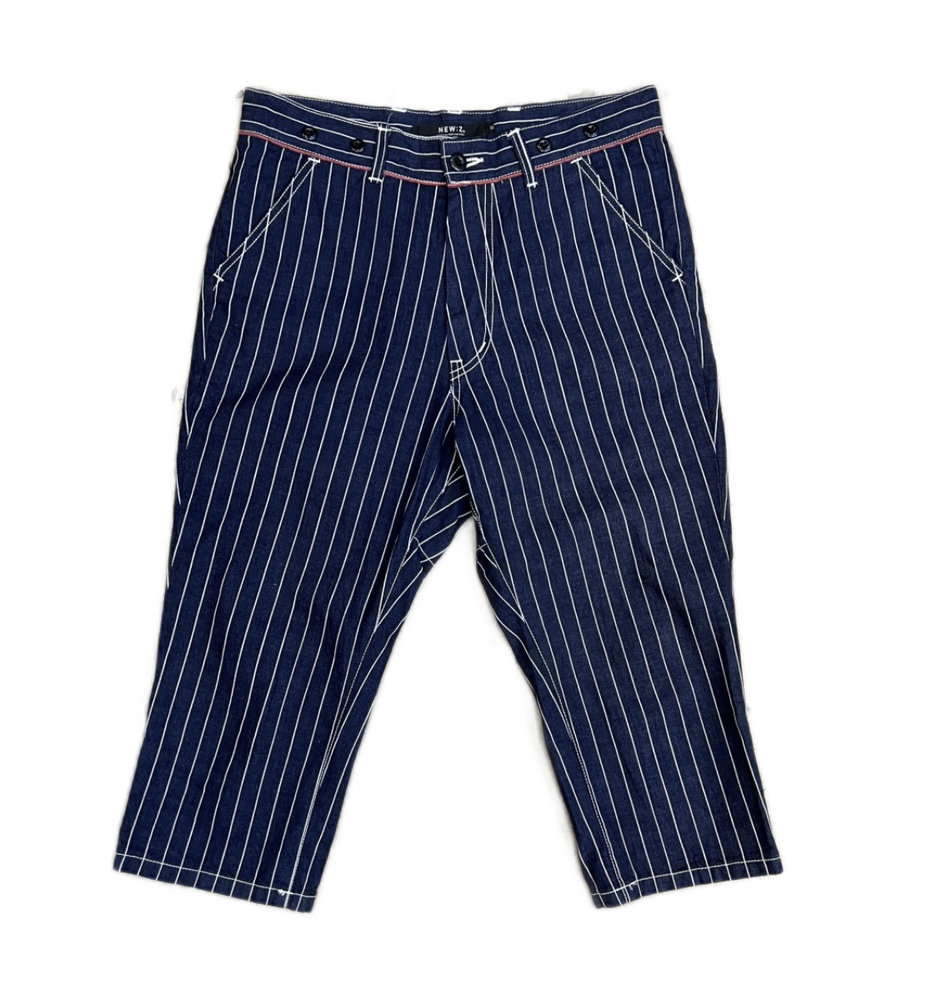

In [24]:
cutout

In [25]:
# result = np.array(cutout)
# result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
# cv2.imwrite(osp.join(output_dir,imgs[0].split('.')[0]+'.png'),result)

In [26]:
#### NEW ###

In [32]:
def remove_background(img_dir,model,output_dir) :
    
    f = np.fromfile(img_dir)
    img = Image.open(io.BytesIO(f)).convert("RGB")
    sample = preprocess(np.array(img))

    with torch.no_grad():
        if use_gpu:
            inputs_test = torch.cuda.FloatTensor(
                sample["image"].unsqueeze(0).cuda().float()
            )
        else:
            inputs_test = torch.FloatTensor(sample["image"].unsqueeze(0).float())

        d1, d2, d3, d4, d5, d6, d7 = model(inputs_test)

        pred = d1[:, 0, :, :]
        predict = norm_pred(pred)

        predict = predict.squeeze()
        predict_np = predict.cpu().detach().numpy()
        mask = Image.fromarray(predict_np * 255).convert("RGB")
        mask = mask.convert('L')

        del d1, d2, d3, d4, d5, d6, d7, pred, predict, predict_np, inputs_test, sample
        
    if alpha_matting:
        try : 
            print(' USE : alpha_matting! ')
            cutout = alpha_matting_cutout(
                img,
                mask,
                foreground_threshold=240,
                background_threshold=10,
                erode_structure_size=15,   #    "-ae",
                base_size=1000
                )
        except Exception:
            cutout = naive_cutout(img, mask)
    else:
        cutout = naive_cutout(img, mask)    
        
    result = cutout
#     result = np.array(cutout)
#     result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
    return result

In [39]:
use_gpu = True  
    
input_dir='TEST_IMGS'
output_dir = 'RESULTS'

model_name = 'UNETP' ##  'UNET' or 'UNETP'
model_dir = 'model_files'
assert model_name in ['UNET','UNETP'], "[Check] Available Model !!"

imgs = os.listdir(input_dir)
imgs = [i for i in imgs if i.split('.')[-1].lower() in ['jpg','jpeg','png']]

In [40]:
alpha_matting = True  # True False

print('model : ',model_name)
if model_name =='UNETP' :
    model = u2net.U2NETP(3, 1)
    model_file = osp.join(model_dir,'rembg_UNETPmodel2021_11_25.pt')
elif model_name =='UNET' :
    model = u2net.U2NET(3, 1)
    model_file = osp.join(model_dir,'rembg_UNETmodel2021_11_25.pt')

model.to(device)
## Basically, the [GPU-Memory] allocated by the model -> 2000MB
model.load_state_dict(torch.load(model_file)['model_state_dict'])
model.eval()

model :  UNETP


U2NETP(
  (stage1): RSU7(
    (rebnconvin): REBNCONV(
      (conv_s1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn_s1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu_s1): ReLU(inplace=True)
    )
    (rebnconv1): REBNCONV(
      (conv_s1): Conv2d(64, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn_s1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu_s1): ReLU(inplace=True)
    )
    (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (rebnconv2): REBNCONV(
      (conv_s1): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn_s1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu_s1): ReLU(inplace=True)
    )
    (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=True)
    (rebnconv3): REBNCONV(
      (conv_s1): Conv2d(16, 16, 

In [41]:
imgs

['prof1.jpg',
 'prof2.jpg',
 'jungo_onepiece6.PNG',
 'KakaoTalk_20220706_092637061.jpg',
 'KakaoTalk_20220706_092637061_01.jpg']

  0%|                                                                                                              | 0/5 [00:00<?, ?it/s]

 USE : alpha_matting! 


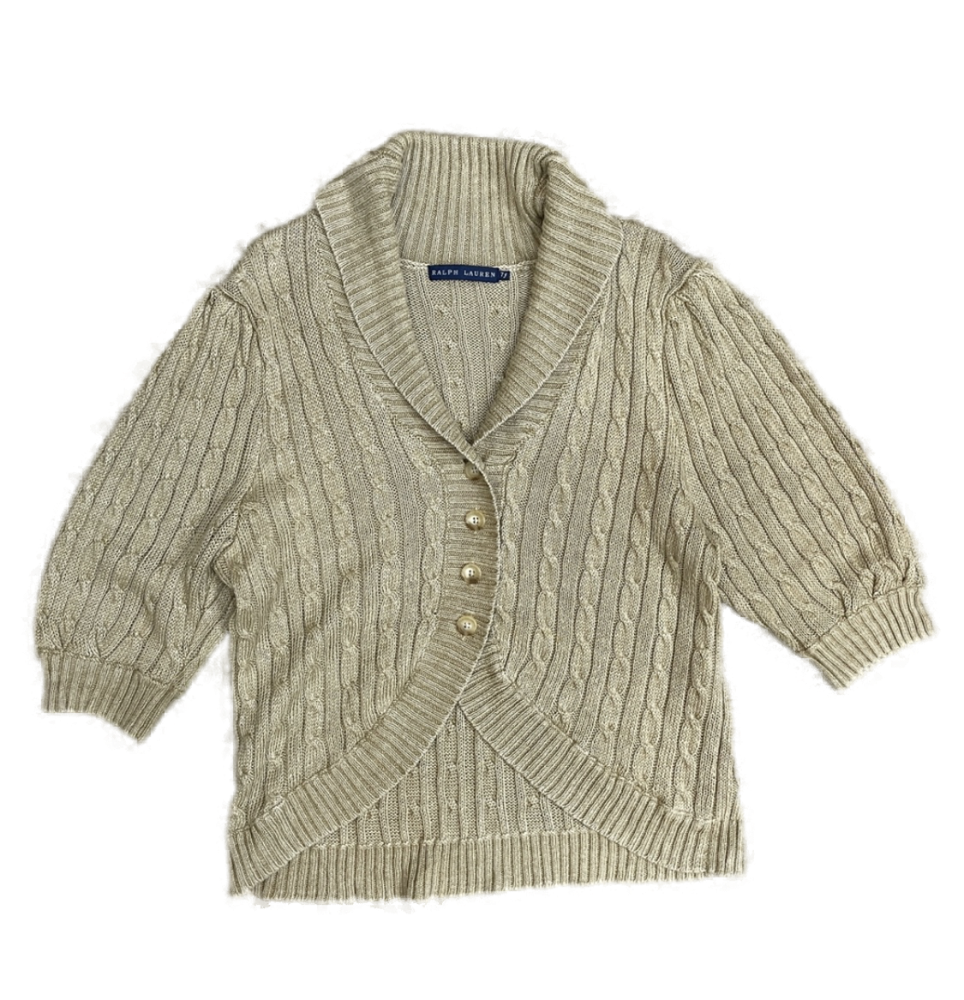

 20%|████████████████████▍                                                                                 | 1/5 [00:01<00:06,  1.70s/it]

 USE : alpha_matting! 
PERFORMANCE WARNING:
Thresholded incomplete Cholesky decomposition failed due to insufficient positive-definiteness of matrix A with parameters:
    discard_threshold = 1.000000e-04
    shift = 0.000000e+00
Try decreasing discard_threshold or start with a larger shift



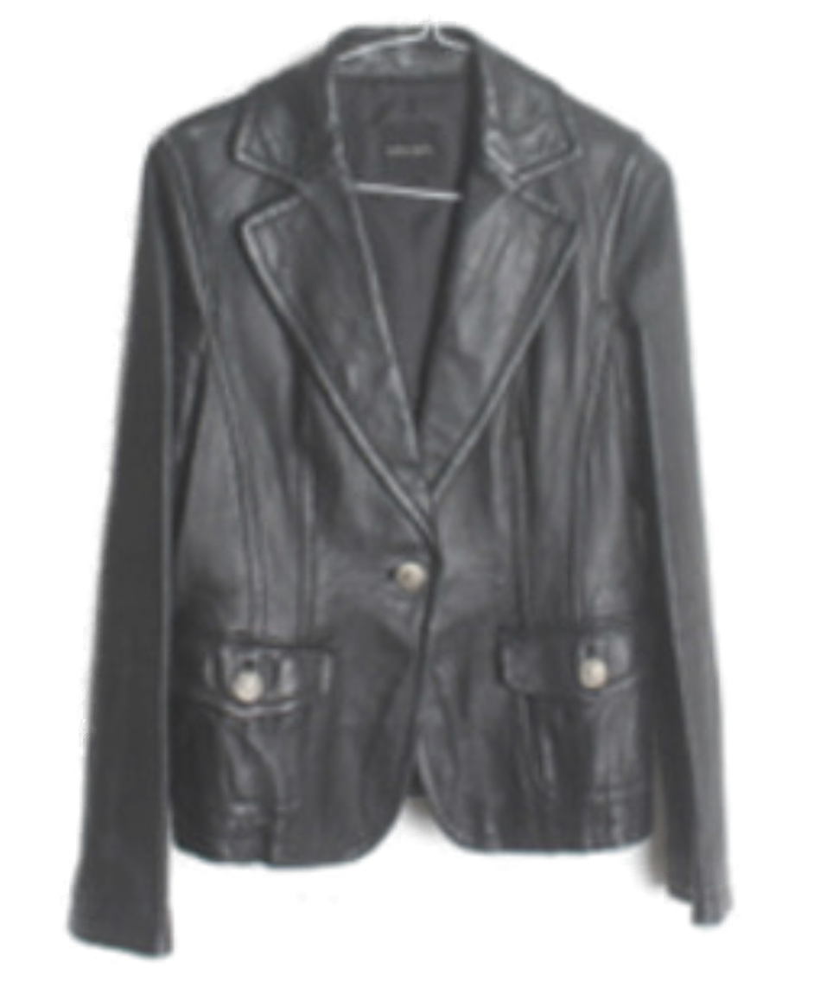

 40%|████████████████████████████████████████▊                                                             | 2/5 [00:04<00:06,  2.24s/it]

 USE : alpha_matting! 


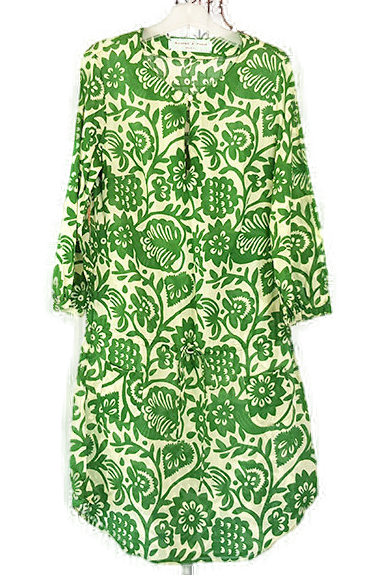

 60%|█████████████████████████████████████████████████████████████▏                                        | 3/5 [00:05<00:03,  1.55s/it]

 USE : alpha_matting! 


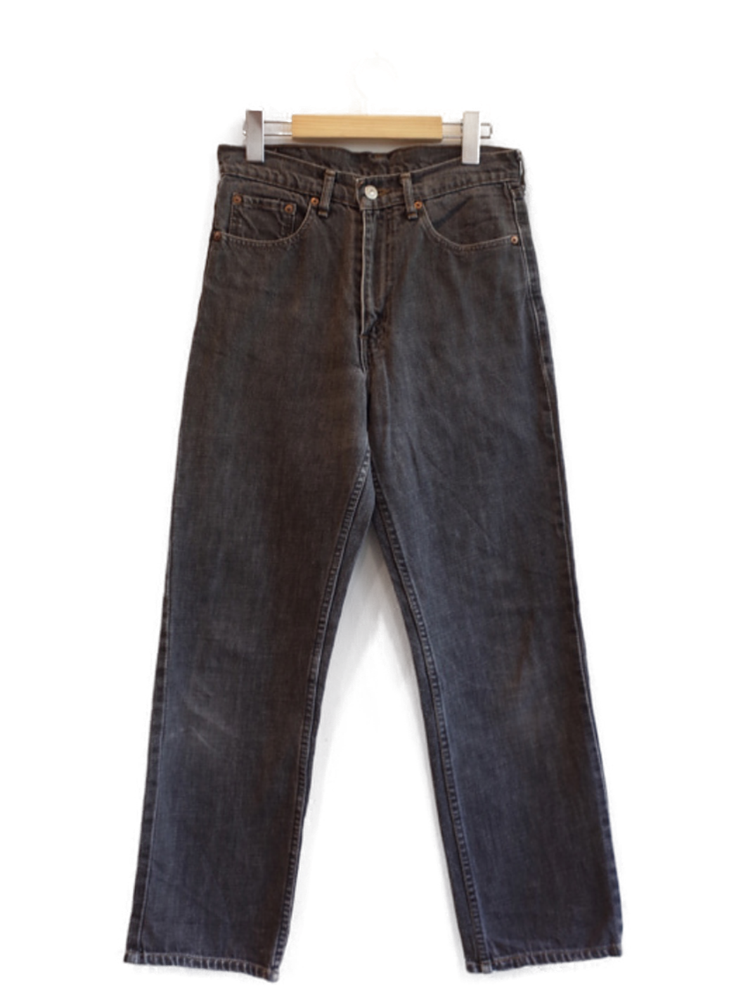

 80%|█████████████████████████████████████████████████████████████████████████████████▌                    | 4/5 [00:07<00:01,  1.74s/it]

 USE : alpha_matting! 


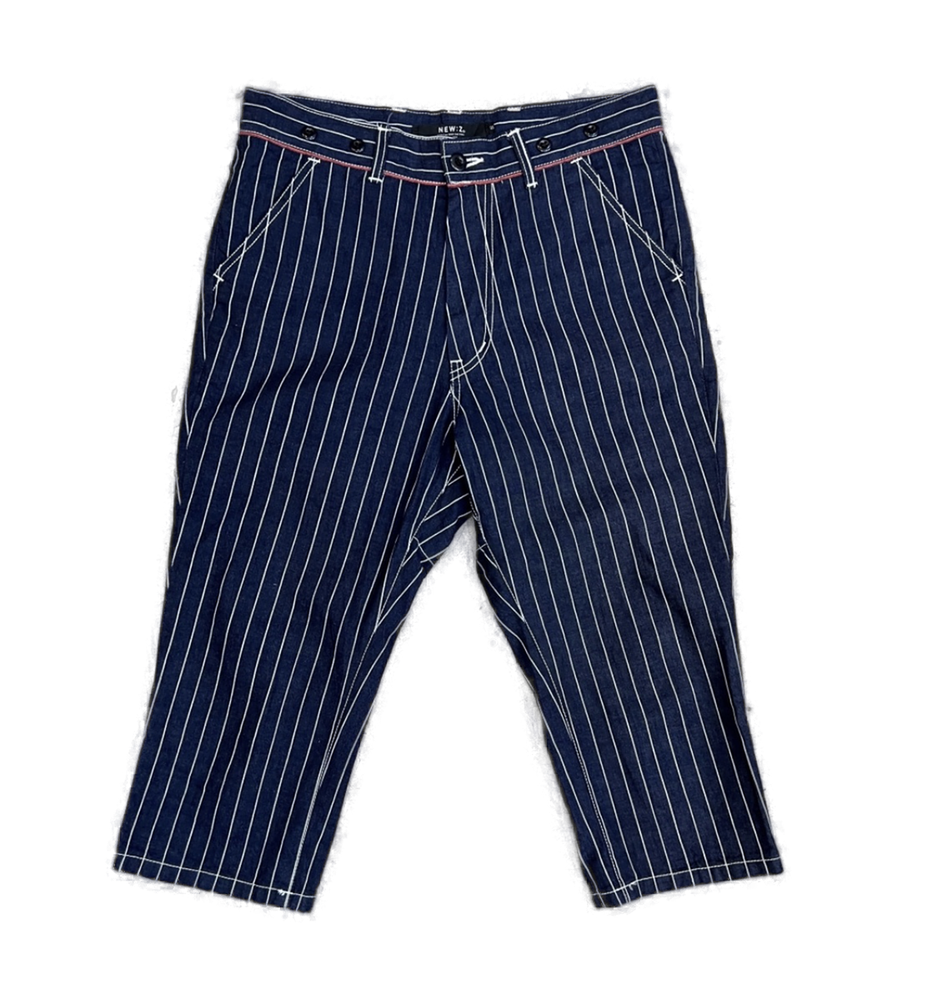

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:08<00:00,  1.75s/it]


In [42]:
test_bar = tqdm(range(len(imgs))) 
for i in test_bar :
    img_path = osp.join(input_dir,imgs[i])
    result = remove_background(img_dir=osp.join(img_path),model=model,output_dir=output_dir)
    display(result)

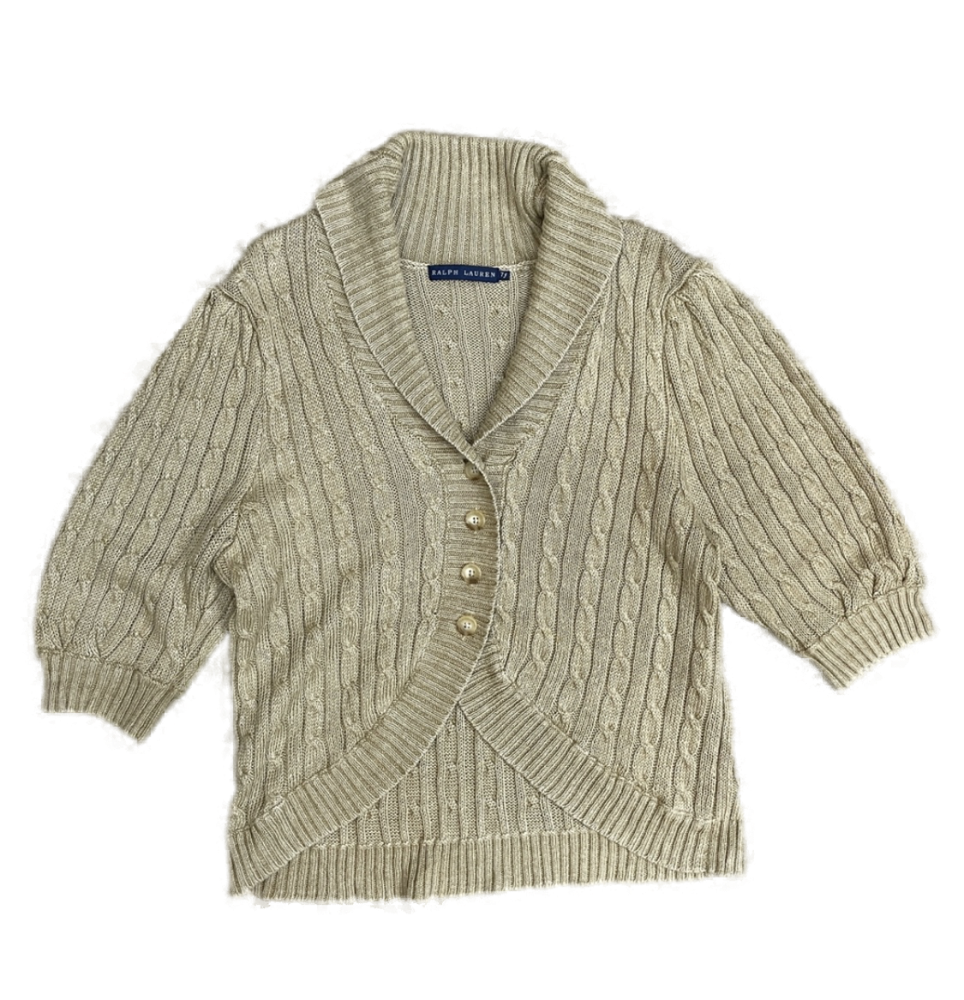

In [37]:
result

In [44]:
result.save(osp.join('RESULTS','t.png'), 'png')


In [14]:
#     save_file_name = img_path.split('/')[-1]
#     save_file_name = save_file_name.split('.')[0]+'.png'
#     cv2.imwrite(osp.join(output_dir,save_file_name),result)
#     print('Prediction Result Save :',osp.join(output_dir,img_dir.split('.')[0]+'.png'))

In [48]:
os.getcwd()

'/mnt/nas3/hm/clothes/rembg_pack'

In [54]:
imgs = os.listdir('./TEST_IMGS')
[i for i in imgs if i.split('.')[-1].lower() in ['jpg','jpeg','png']]

['prof1.jpg',
 'prof2.jpg',
 'jungo_onepiece6.PNG',
 'KakaoTalk_20220706_092637061.jpg',
 'KakaoTalk_20220706_092637061_01.jpg']

In [52]:
'prof1.PNG'.split('.')[-1].lower()

'png'